<a href="https://colab.research.google.com/github/rfishe02/ORB_Short_Example/blob/main/ORB_vs_ResNet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries
---


In [1]:
# Import the libraries we'll use to perform computer vision and classification

import cv2
import imutils
import numpy as np
from numpy.linalg import norm
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis

# (Optional) Import the libraries we'll use to plot data. This is useful for instruction, but may not be needed in an application

from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow

# Utilities for file reading

import os
import pathlib

# Define Helper Functions
---



In [2]:
# For ResNet-50 feature extraction
def extract_features(img_array, model):
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)
  features = model.predict(preprocessed_img)
  flattened_features = features.flatten()
  normalized_features = flattened_features / norm(flattened_features)
  
  return normalized_features

def resize(image, input_shape):
  return cv2.resize(image.copy(), input_shape, interpolation = cv2.INTER_LINEAR)

# It takes several steps to adjust the contrast of an image
def adjust_contrast(image):
  # Converting to LAB color space
  lab_space = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2LAB)
  l_channel, a_channel, b_channel = cv2.split(lab_space)

  # Applying CLAHE to L-channel
  clahe = cv2.createCLAHE(clipLimit = 25.0, tileGridSize = (8,8))
  clahe_enhanced = clahe.apply(l_channel)

  # Merge the CLAHE enhanced L-channel with the a and b channel
  lab_model = cv2.merge((clahe_enhanced, a_channel, b_channel))

  # Convert image from LAB Color model to BGR color spcae
  enhanced_image = cv2.cvtColor(lab_model, cv2.COLOR_LAB2BGR)

  return enhanced_image

# Used to give ORB descriptors a consistent length, a requirement for KNN library
def pad_arrays(arrays, widest_col):
  padded_arrays = []

  for array in arrays:
    padded_arrays.append(np.pad(array, (0, widest_col - len(array)), 'constant').tolist())

  return padded_arrays

In [3]:
def plot_images(image, similar_image_paths, distances, message):

  images = []

  for filename in similar_image_paths:
    images.append(mpimg.imread(filename))

  plt.figure(figsize=(14, 6))
  columns = 4

  ax = plt.subplot(len(images) / columns + 1, columns, 0 + 1)
  ax.set_title("\n\n" + message + "\n\n")
  plt.axis('off')
  plt.imshow(image)

  for i, image in enumerate(images):
    ax = plt.subplot(len(images) / columns + 1, columns, i + 2)
    ax.set_title("\n\n" + similar_image_paths[i].split("/")[-1] + "\n" + "\nDistance: " + str(float("{0:.2f}".format(distances[i]))))
    plt.axis('off')
    plt.imshow(image)

# Training Two KNN Classifiers
---

We'll create two classifiers and compare the performance of each one later. One classifier will train on flattened ORB descriptors, and the other one will train on features extracted by ResNet-50.



## Training Data

The training dataset includes images of the cards we'd like to identify and several dozen randomly chosen cards from scryfall.com.

We're not going to put the whole image into our classifier. Instead, we'll only extract a small amount of useful information. In a classical computer vision approach, we would use an algorithm like ORB to extract information from an image. In a modern approach, we might use a pretrained neural network to get useful features, but they're commonly called embeddings. 

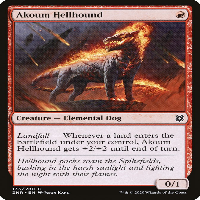

In [4]:
# Get a list of files in the training data directory & create a list of file extensions we'll check for
training_images_directory = '/content/drive/MyDrive/Colab-Data/ORBvsResNet-50/magic-cards'
training_dataset = os.listdir(training_images_directory)
extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']

# (Optional) Show an example of the training data
sample_image = cv2.imread(training_images_directory + "/" + training_dataset[0])
cv2_imshow(resize(sample_image, (200, 200)))

## Training KNN on Orb Descriptors

For each image in our training dataset, we extract ORB descriptors, flatten them, and then add the flattened descriptor to a list of ORB training data. We create a KNN model and train it on the list of ORB training data.

In [5]:
ORB_knn = KNeighborsClassifier(n_neighbors = 3, weights = 'distance')
orb = cv2.ORB_create(nfeatures = 50)

ORB_training_data = []
ORB_training_labels = [] 
ORB_filenames = []

i = 0
for file in training_dataset:
  file_split = os.path.splitext(file)

  if any(ext in file_split[1] for ext in extensions):
    ORB_filenames.append(training_images_directory + '/' + file)

    # Use integers for the labels
    ORB_training_labels.append(i)
    i += 1

    # Load the image and resize it
    training_image = cv2.imread(training_images_directory + '/' + file)
    training_image = cv2.cvtColor(training_image, cv2.COLOR_BGR2RGB)

    training_resized = resize(training_image, (200, 200))

    # Extract the features with ORB and add it to our training data
    keypoints = orb.detect(training_resized, None)
    keypoints, descriptors = orb.compute(training_resized, keypoints)

    ORB_training_data.append(descriptors.flatten().tolist())

# Pad the data so we can use it in training (all must be equal length)
padded_ORB_training_data = pad_arrays(ORB_training_data, 2000)

# Fit a nearest neighbor classifier on the training data set
ORB_knn.fit(padded_ORB_training_data, ORB_training_labels)

KNeighborsClassifier(n_neighbors=3, weights='distance')

## Training KNN on ResNet-50 Features

Instead of extracting ORB descriptors, we use the pretrained model ResNet-50 to extract features from each image in our training dataset. We train a separate KNN model on the list of features we gathered from the training dataset.



In [6]:
knn = KNeighborsClassifier(n_neighbors = 3, weights = 'distance')
model = ResNet50(weights = 'imagenet', include_top = False, input_shape = (200, 200, 3))

training_data = []
training_labels = []
filenames = []

label_lookup = {}

i = 0
for file in training_dataset:
  file_split = os.path.splitext(file)

  if any(ext in file_split[1] for ext in extensions):
    filenames.append(training_images_directory + '/' + file)

    # Use integers for the labels
    training_labels.append(i)
    label_lookup[i] = file
    i += 1

    # Load the image and resize it
    training_image = cv2.imread(training_images_directory + '/' + file)
    training_image = cv2.cvtColor(training_image, cv2.COLOR_BGR2RGB)

    training_resized = resize(training_image, (200, 200))

    # Extract the features with the ResNet-50 model and add it to our training data
    training_features = extract_features(training_resized, model)
    training_data.append(training_features)

# Fit KNN on the training dataset
knn.fit(training_data, training_labels)

1/1 [==============================] - 0s 185ms/step


KNeighborsClassifier(n_neighbors=3, weights='distance')

# Detecting Cards and Extracting Features
---
Our object recognition system has two goals: finding cards and identifying them. We've already created two classifiers that can identify cards. Now, we're going to try to find one or more cards in a test environment. We'll save these cards to a list, and then we'll classify each one later.

## Test Data
---

We'll load an image of various cards sitting on a table. This image represents the environment where we might test our system.


In [7]:
# Load the image and convert it to RGB, since OpenCV reads BGR
image = cv2.imread('/content/drive/MyDrive/Colab-Data/ORBvsResNet-50/cards.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

## Image Pre-Processing

We apply various transformations to make it easier to locate the outline of the cards.



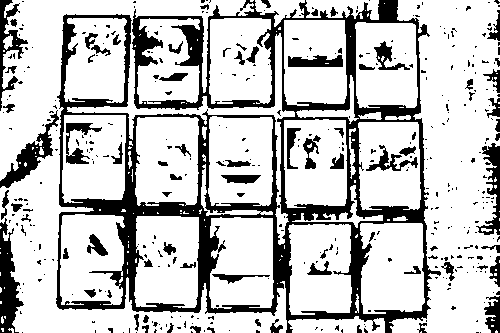

In [8]:
# Resize it so that shapes can be approximated better
resized_image = imutils.resize(image.copy(), width = 500)
resize_ratio = image.shape[0] / float(resized_image.shape[0])

# Convert the enhanced image to grayscale, blur it slightly, and threshold it
enhanced_image = adjust_contrast(resized_image)
gray = cv2.cvtColor(enhanced_image, cv2.COLOR_RGB2GRAY)
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
thresholded = cv2.threshold(blurred, 75, 255, cv2.THRESH_BINARY)[1]

# (Optional) Show the transformed image
cv2_imshow(thresholded)

## Locating Cards

Next, we'll locate each card in the image and cut out them out from the original image. We're creating small images that are easier to classify, since our KNN classifiers learned to recognize images of single cards. First, we'll find the contours in the image, then for each contour we'll create a bounding box, and then we'll use its coordinates to cut out the image.

In [9]:
# (Optional) Create a copy of the original image for illustration
image_copy = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2BGR)

# Find contours in the altered image
contours = cv2.findContours(thresholded.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(contours)

detected_cards = []
for contour in contours:

  # Approximate the contour
  peri = cv2.arcLength(contour, True)
  approx = cv2.approxPolyDP(contour, 0.04 * peri, True)

  # Compute the bounding box of the contour and the aspect ratio
  x, y, width, height = cv2.boundingRect(approx)
  aspect_ratio = round(height / float(width),1)

  # (Optional) Resize the contours and draw them in white
  contour_resized = contour.astype("float")
  contour_resized *= resize_ratio
  contour_resized = contour_resized.astype("int")
  cv2.drawContours(image_copy, [contour_resized], -1, (255, 255, 255), 2)

  width_resized = int(width * resize_ratio)
  height_resized = int(height * resize_ratio)
  area = width_resized * height_resized

  # Assume we have a card if the aspect ratio & area is in a certain range
  if aspect_ratio > 1.2 and aspect_ratio < 1.6 and area > 1000:

    # Resize the bounding box coordinates, (Optional) and draw the bounding box in yellow
    x_resized = int(x * resize_ratio)
    y_resized = int(y * resize_ratio)
    cv2.rectangle(image_copy, (x_resized, y_resized), (x_resized + width_resized, y_resized + height_resized), (0,255,255), 3)

    # Cut out from the original image using the resized bounding box coordinates
    image_cropped = image[y_resized : y_resized + height_resized, x_resized : x_resized + width_resized]

    # For simplicity, we'll add the cards to an array & process them later
    detected_cards.append(image_cropped)

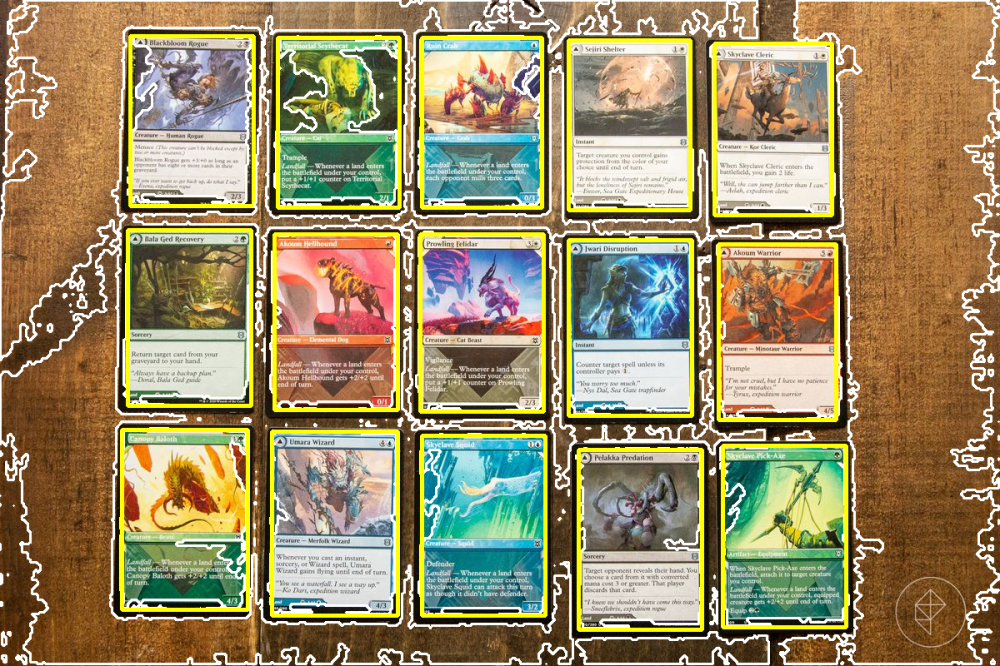

In [10]:
# (Optional) Show the copied image with the contours and bounding boxes
cv2_imshow(imutils.resize(image_copy, width=1000)) 

## Feature Extraction

We'll use the same approach that we used to create training data on each card that we detected in the test image. This time, we'll create two sets of data that we'll use to test our classifiers.

### Extracting Card Features with ORB



In [11]:
ORB_test_data = []
ORB_test_card_images = []

for card in detected_cards:

  # Resize the image
  test_resized = resize(card, (200, 200))

  # Extract the features with ORB and add it to our ORB test data
  keypoints = orb.detect(test_resized, None)
  keypoints, descriptors = orb.compute(test_resized, keypoints)

  if descriptors is not None:
    ORB_test_data.append(descriptors.flatten().tolist())
    ORB_test_card_images.append(test_resized)

# Pad the data, so we can use it in the ORB KNN classifier
padded_ORB_data = pad_arrays(ORB_test_data, 2000)

### Extracting Card Features with ResNet-50




In [12]:
test_data = []
test_card_images = []

for card in detected_cards:

  # Resize the image
  test_resized = resize(card, (200, 200))

  # Extract the features with the ResNet-50 model and add it to our test data
  test_features = extract_features(test_resized, model)
  test_data.append(test_features)

  test_card_images.append(test_resized)

1/1 [==============================] - 0s 183ms/step


# Testing Two KNN Classifiers on Feature Data
---

We'll use the list of ORB descriptors to test the KNN model trained on ORB descriptors, and we'll use the list of ResNet-50 features to test the KNN model trained on ResNet-50 features.

## Performance of ORB Descriptors

The KNN model trained on flattened ORB descriptors doesn't consistently identify the correct card. It seems like it associates cards with a similar layout, for example, all neighboring cards have subjects on the same side.

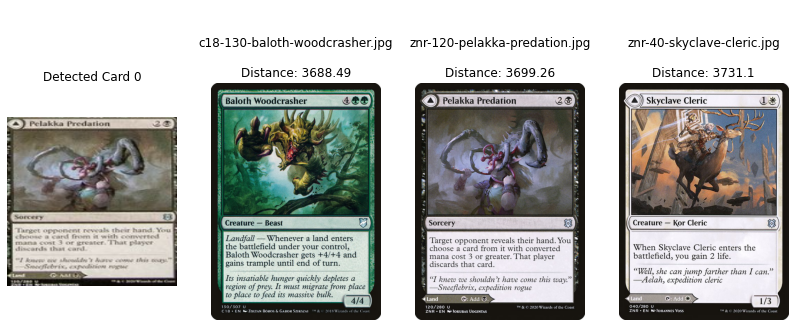

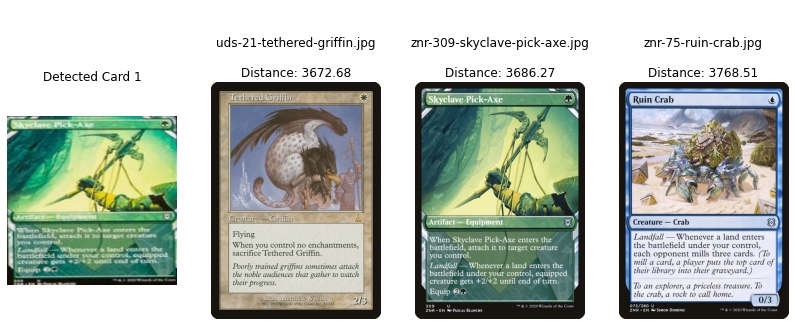

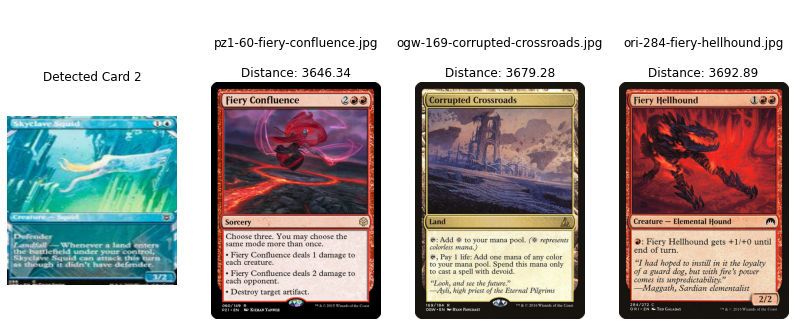

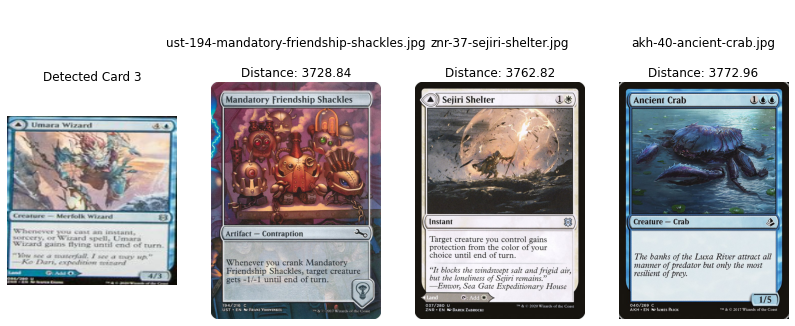

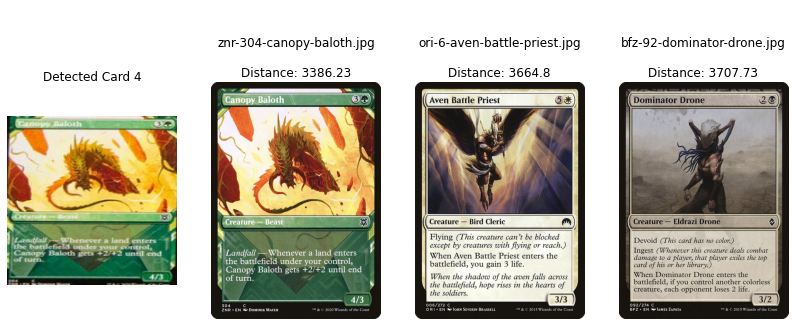

...

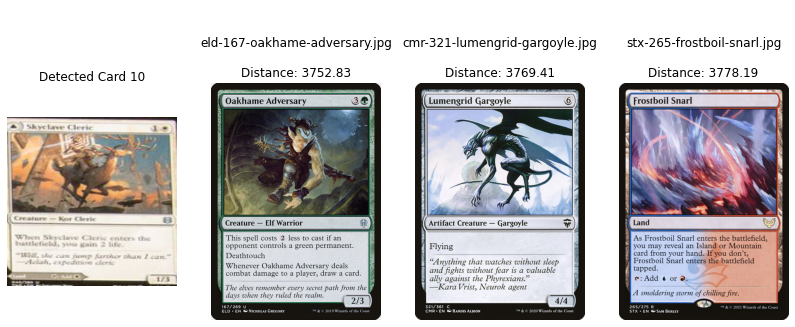

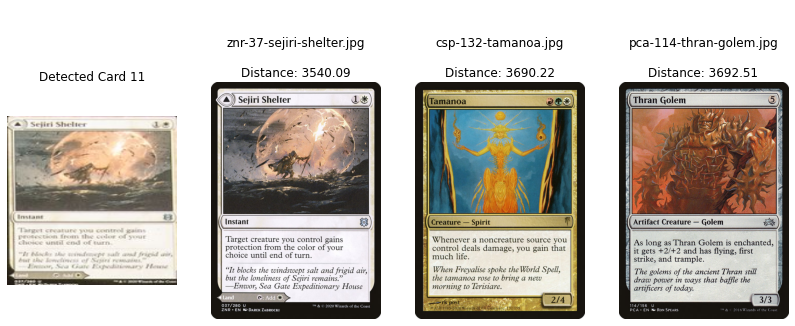

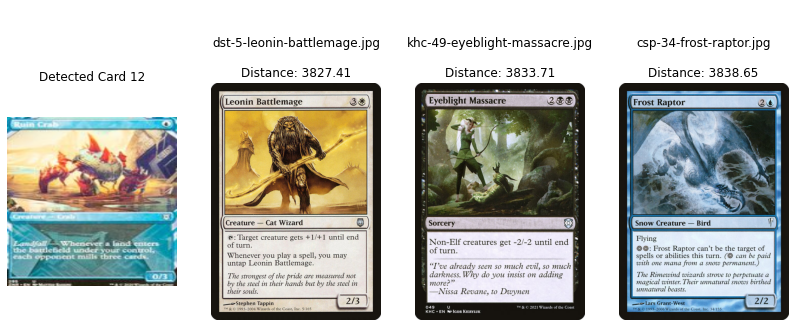

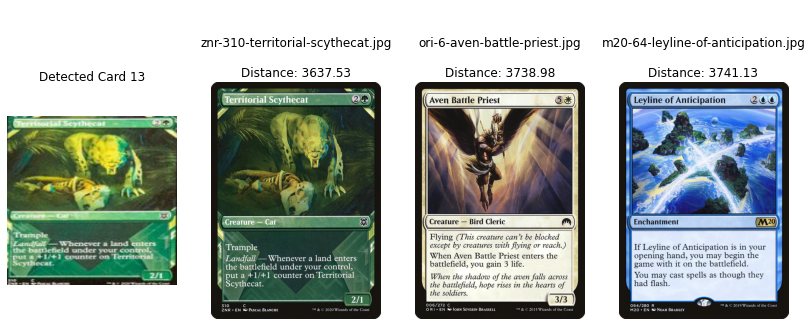

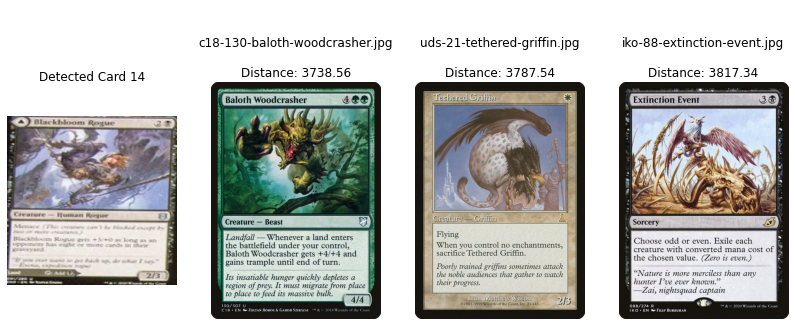

In [13]:
# Display the images we detected earlier & show similiar cards
for index in range(len(padded_ORB_data)):

  data = padded_ORB_data[index]
  card_image = ORB_test_card_images[index]

  # Use KNN to find the closet neighbors
  distances, indices = ORB_knn.kneighbors([data], return_distance = True)

  # Note: the neighbor indices may be the same order as the files that were read
  similar_image_paths = [ORB_filenames[indices[0][i]] for i in range(len(indices[0]))]
  plot_images(card_image, similar_image_paths, distances[0], 'Detected Card ' + str(index))

## Performance of ResNet50 Features

The KNN model trained on ResNet50 features consistently finds the correct card. It also seems like it's better at finding cards that have the same layout and color composition

In [14]:
# Note: We can get a list of predictions for the list of cards we saved earlier
predictions = knn.predict(test_data)

print("List of Predictions for Each Detected Card:")
for label in predictions:
  print(label_lookup[label])

# Note: We can also get one prediction for a single card. Since we used distance as a weight, it is likely to return the closest.
prediction = knn.predict([test_data[0]])

print("\nSingle Prediction for the First Detected Card:")
print(label_lookup[prediction[0]])

List of Predictions for Each Detected Card:
znr-120-pelakka-predation.jpg
znr-309-skyclave-pick-axe.jpg
znr-296-skyclave-squid.jpg
znr-86-umara-wizard.jpg
znr-304-canopy-baloth.jpg
znr-134-akoum-warrior.jpg
znr-64-jwari-disruption.jpg
znr-299-akoum-hellhound.jpg
znr-294-prowling-felidar.jpg
znr-180-bala-ged-recovery.jpg
znr-40-skyclave-cleric.jpg
znr-37-sejiri-shelter.jpg
znr-295-ruin-crab.jpg
znr-310-territorial-scythecat.jpg
znr-91-blackbloom-rogue.jpg

Single Prediction for the First Detected Card:
znr-120-pelakka-predation.jpg


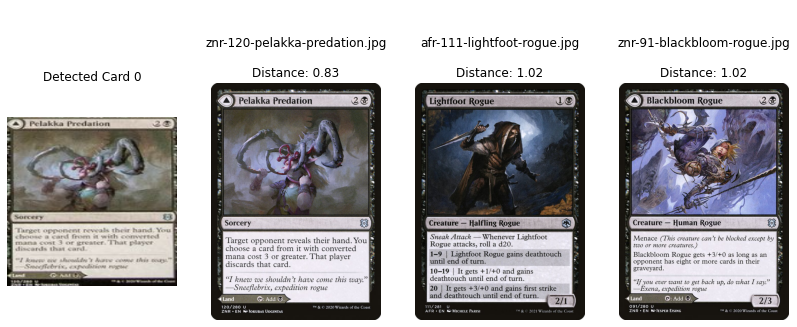

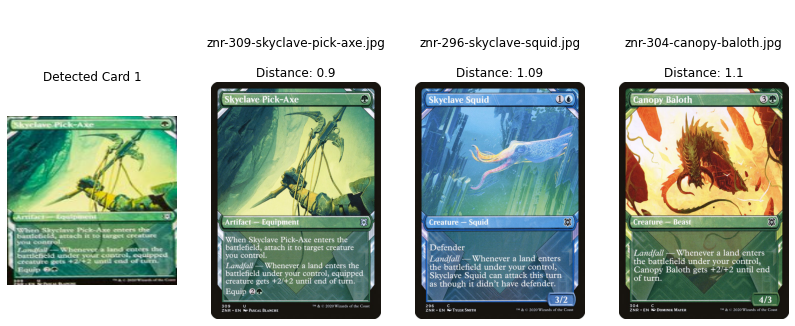

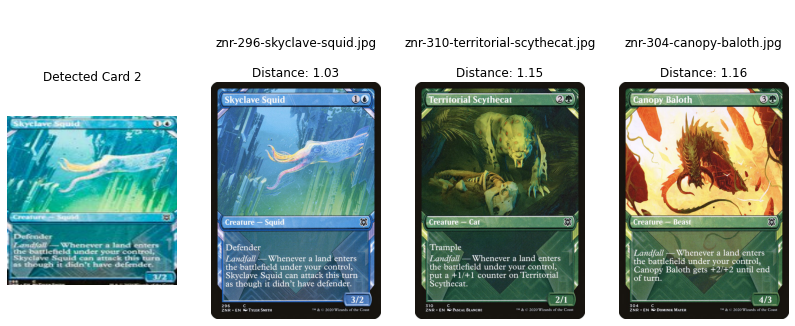

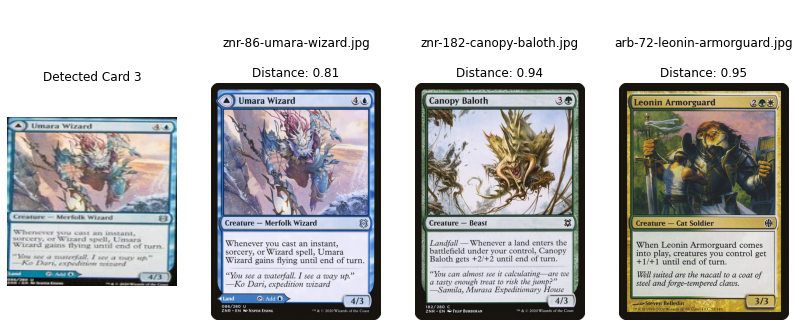

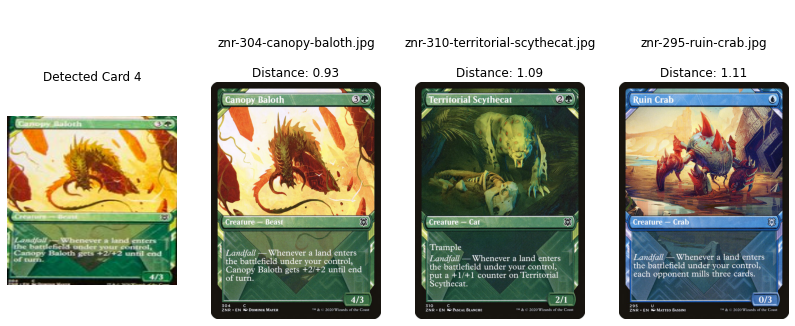

...

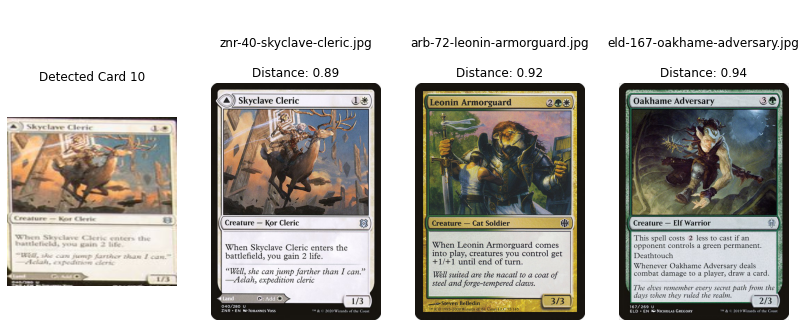

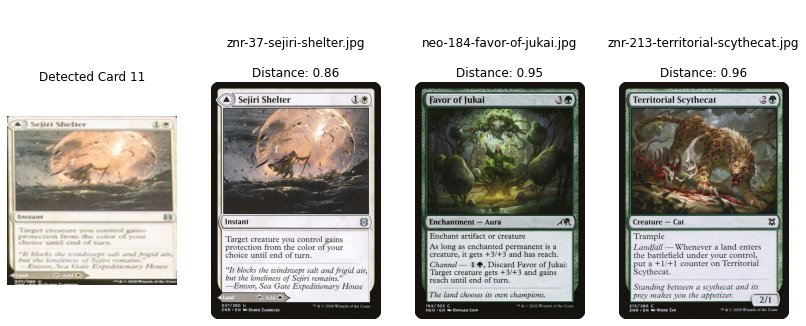

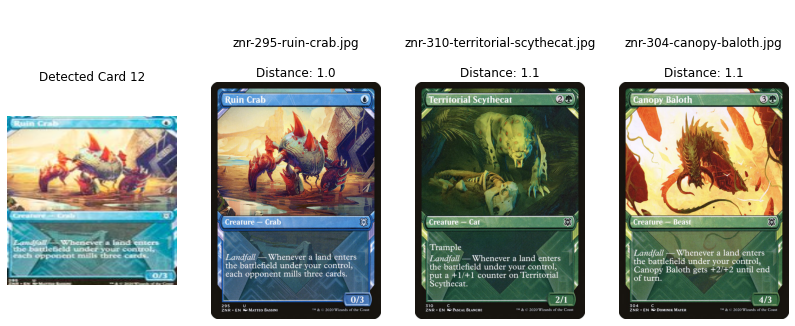

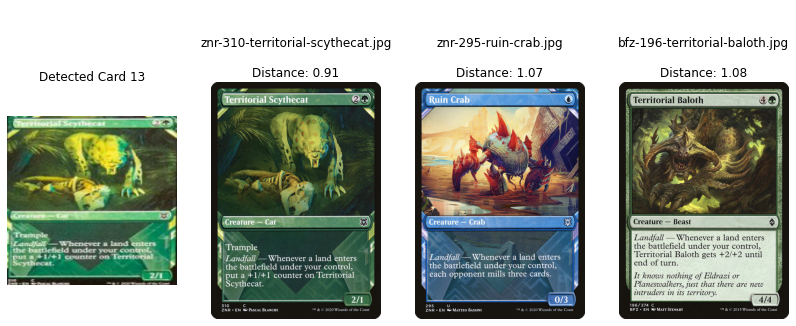

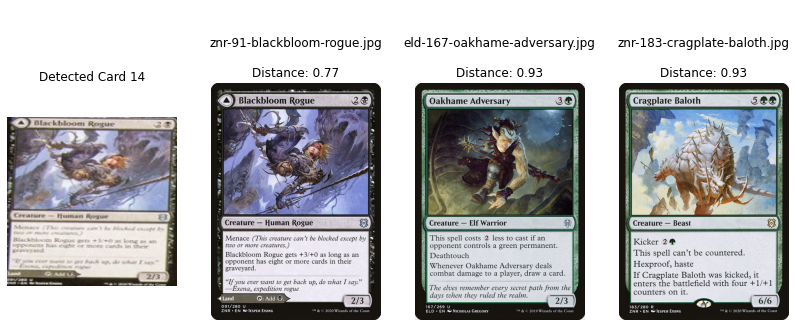

In [15]:
# Display the images we detected earlier & show similiar cards
for index in range(len(test_data)):

  data = test_data[index]
  card_image = test_card_images[index]

  # Use KNN to find the closet neighbors
  distances, indices = knn.kneighbors([data], return_distance = True)

  # Note: the neighbor indices may be the same order as the files that were read
  similar_image_paths = [filenames[indices[0][i]] for i in range(len(indices[0]))]
  plot_images(card_image, similar_image_paths, distances[0], 'Detected Card ' + str(index))

# Future Work
---
*   Improve image recognition on rotated cards.
*   See how it performs on a much larger dataset.
*   Try using a neural network to detect cards.
*   Measure performance.



# Sources
---
*   Object Detection with Deep Learning: A Review https://arxiv.org/abs/1807.05511
*   Scryfall Card Search Engine https://scryfall.com/
*   OpenCV shape detection https://pyimagesearch.com/2016/02/08/opencv-shape-detection/
*   ORB (Oriented FAST and Rotated BRIEF) https://docs.opencv.org/3.4/d1/d89/tutorial_py_orb.html
*   Understanding k-Nearest Neighbour https://docs.opencv.org/3.4/d5/d26/tutorial_py_knn_understanding.html
*   Chapter 4. Building a Reverse Image Search Engine: Understanding Embeddings https://www.oreilly.com/library/view/practical-deep-learning/9781492034858/ch04.html


















